In [1]:
import pandas as pd
import numpy as np
import scipy.stats as stats
import plotly.express as px

In [4]:
# 1. 28_Machine1.csv 데이터를 df1으로, 28_Machine2.csv 데이터를 df2로 선언하고, df1 데이터를 'Process_Route'와 'Label' 값을 기준으로 데이터를 재구조화 하시오.
#     - Table 병합 결과 : Row 7,830 / Columns 4

df1 = pd.read_csv('../hanro_test/0610/28_Machine1.csv').drop('Unnamed: 0', axis=1).melt(id_vars=['Process_Route', 'Label'])
df2 = pd.read_csv('../hanro_test/0610/28_Machine2.csv').drop('Unnamed: 0', axis=1)
print(df1.shape)
df1.head(2)

(7830, 4)


,Process_Route,Label,variable,value
0,route_11111,A,IA0103,0.0
1,route_11111,B,IA0103,0.0


In [5]:
# 2. 앞서 재구조화한 데이터와 df2 데이터를 Process_Route를 기준으로 병합하시오.
#     - Table 병합 결과 : Row 130,848 / Columns 13

merge_df = pd.merge(df1, df2, on = 'Process_Route', how = 'inner')
print(merge_df.shape)
merge_df.head(2)

(130848, 13)


,Process_Route,Label,variable,value,C60,C90,C160,C480,C840,Energy,Temp,Process_TF,ID
0,route_11111,A,IA0103,0.0,1.010194e+16,2.132326e+16,7.534695e+17,3.016070e+17,6.000010e+17,31093.054,101.814,False,NOLSM27127
1,route_11111,A,IA0103,0.0,1.183858e+16,1.523685e+17,8.645223e+17,3.005535e+17,5.999990e+17,31818.941,100.949,False,NOLSM75321


In [6]:
# 3. 병합한 데이터에서 반도체 Wafer의 품질 수준을 나타내는'Label'값을 Y로, 공정에 사용되는 값, C60 / C90 / C160 / C480 / C840 데이터를 X로 선언해 Y를 분류하는 모델을 생성하려 한다. 서로 다른 최적화 기법을 사용하는 3가지 모델을 각각 만들어 Y를 분류하는 모델을 구성하시오.
#     - X : C60 / C90 / C160 / C480 / C840
#     - 특성 공학 기법 활용
#     - 트리기반의 모델 / 회귀기반의 모델 / 앙상블 모델 활용
#     - 각 모델의 성능과 변수중요도(또는 회귀계수나 순열 중요도)를 확인

from sklearn.model_selection import train_test_split

y = merge_df['Label'].replace({'A':1, 'B':0})
x = merge_df[['C60', 'C90', 'C160', 'C480', 'C840']]
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=1234)

C:\Users\leedo\AppData\Local\Temp\ipykernel_1980\2259580787.py:9: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  y = merge_df['Label'].replace({'A':1, 'B':0})


In [7]:
from imblearn.pipeline import make_pipeline # 선형 회귀 식을 이용해 연속형 자료에 대한 결측값을 대치
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV

# 다양한 알고리즘을 호출 모델을 구성
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier # 랜덤 포레스트, 그래디언트 부스팅
from sklearn.svm import SVC # 서포트 벡터 머신
from sklearn.metrics import classification_report

In [8]:
# 파이프라인 설계
pipe_RF = make_pipeline(IterativeImputer(estimator=LinearRegression()),
             StandardScaler(), RandomForestClassifier())
pipe_GB = make_pipeline(IterativeImputer(estimator=LinearRegression()),
             StandardScaler(), GradientBoostingClassifier())
pipe_SVC = make_pipeline(IterativeImputer(estimator=LinearRegression()),
             StandardScaler(), SVC())

In [10]:
# RF -> bootstrap sampling + random feature selection + tree
hyper = {'randomforestclassifier__max_depth':[3, 4, 5],
         'randomforestclassifier__criterion':['gini', 'entropy'],
         'randomforestclassifier__min_samples_split':[10, 30, 50]}
grid_model_RF = GridSearchCV(pipe_RF, param_grid=hyper, cv = 3, n_jobs=-1, scoring='f1')
grid_model_RF.fit(x_train, y_train)
best_model_RF = grid_model_RF.best_estimator_

In [12]:
import pickle

pickle.dump(best_model_RF, open('model_RF.sav', 'wb'))

- **GB hyperparameter**: 복원추출된 데이터를 단일 모델이 학습 후, 학습의 결과를 반영하여 다음 복원 추출에 사용(오차를 weight가중치를 계산하여 반영)
- n_estimators: 수행할 부스팅 단계 수(사용할 tree 개수)
- max_depth, min_samples_split, min_samples_leaf
- learning_rate: 각 트리의 오차를 계산할 때, 학습율을 지정
  - (일정 이상의 성능이 나오려면) 일반적으로는 학습율이 낮으면 낮을수록 많은 수의 트리가 필요
 
- loss: 가중치의 손실 함수(비용함수)를 지정
  - 기본값 log_loss(로지스틱 회귀에서 사용되는, 이항 분류 및 다항분류에 대한 최적화 손실함수)
  - 'exponential': ada boost과 동이랗게 작동
  - 'deviance'
- subsample: 복원 추출된 데이터의 비율
  - 기본값 1.0: 1보다 작은 수로 값을 세팅하면, 확률적 그래디언트 부스팅 형태로 작동
  - 오차를 계산하기 위해 경사하강법 (복원추출에 모든 데이터를 사용 = 1.0)
  - 0.7, 복원 추출된 데이터의 70% 이용하여 오차를 계산
- n_iter_no_change: 성능이 더이상 개선되지 않을 때 훈련 조기 종료할 지 여부를 결정
  - 지정된 횟수만큼 성능이 개선되지 않을 때 학습을 종료
  - n_estimators = 200, n_iter_no_change = 10
  - 150번 tree부터 점진적학습에 의한 성능 개선이 더이상 x-> 160번째까지 성능 개선이 없다면 학습을 종료

In [13]:
hyper = {'gradientboostingclassifier__n_estimators':[200],
        'gradientboostingclassifier__n_iter_no_change':[5],
        'gradientboostingclassifier__max_depth':[3, 4, 5],
        'gradientboostingclassifier__learning_rate':[0.01, 0.1, 1]}

grid_model_GB = GridSearchCV(pipe_GB, param_grid=hyper, cv = 3, n_jobs=-1, scoring='f1')
grid_model_GB.fit(x_train, y_train)
best_model_GB = grid_model_GB.best_estimator_

In [15]:
pickle.dump(best_model_GB, open('model_GB.sav', 'wb'))

In [14]:
from sklearn.ensemble import AdaBoostClassifier
from xgboost import XGBClassifier

### 최대 마진 분류기 (maximization margine classification)

- 두 클래스(y에서 분류할 두 항목) 데이터의 마진을 최대화또는 최소화 하여 데이터를 예측 분류하는 초평면을 찾는 기법
- 데이터들 간의 벡터를 계간하여, 서로 다른 데이터를 분류 해야하는 경우, 서로다른 데이터가 가장 멀어지는 거리를 찾고, 해당 거리를 중심으로 통과하는 초평면을 찾는 알고리즘
- 마진값을 각가 데이터 포인트에서 계싼을 수행
  - 계산에 대한 소요가 큼(적은 소량의 row데이터에 대해 주로 사용)
  - 다차원 공간에서의 성능이 좋다 (x 열 수가 많은 상황에서 좋은 성능을 발휘)
- support vector machine
- 최대 마진 분류기의 최적화 기법을 이용해, 데이터를 고차원 공간으로 변형하여 데이터를 분할하는 최적의 결정경계를 생성
- 마진: 데이터간 벡터값으로 계산하여 서로 다른 클래스의 벡터의 면적을 이용해 결정 경계를 계산
  - x변수가 연속형이며, 선형성을 만족하는 데이터에 대해 잘 작동
  - 열 개수는 많지만 row개수가 적은 상황에서 매우 효과적으로 사용
  - 비교적 적은 량(1000개 미만 데이터에 대해 사용을 권고)
- hyper parameter tuning:
  - cost: 마진값에 들어갈 수 있는 이상치를 얼마나 허용할 것인가
  - cost적게 부여: 이상치를 많이 허용 -> 마진 값이 커지며 오버피팅 방지(소프트 마진)
  - cost많게 부여: 이상치를 적게 허용 -> 마진 값이 작아지며 성능이 향상 (하드마진)
- 커널: 데이터를 고차원의 특징 공간으로 변환하여, 기존에 보이지 않은 패턴이나 회귀 선을 찾고, 연산의 량을 축소
- 커널값을 통제하게 되면, 데이터의 연산량을 조절할 수 있고, 성능을 향상
- 비선형회귀 기반 모델, 회귀계수나 변수 중요도와 같은 값을 계산할 수 없음, 순열 중요도

In [17]:
hyper = {'svc__C':[0.001, 0.01, 1, 1.5, 2],
        'svc__max_iter':[50]} # 기본값은 -1, 최적조건을 찾을 때 까지 반복하여 마진 계산
grid_model_SVC = GridSearchCV(pipe_SVC, param_grid=hyper, n_jobs=-1, scoring='f1')
grid_model_SVC.fit(x_train, y_train)
best_model_SVC = grid_model_SVC.best_estimator_

C:\Users\leedo\anaconda3\Lib\site-packages\sklearn\svm\_base.py:305: ConvergenceWarning: Solver terminated early (max_iter=50).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


In [18]:
pickle.dump(best_model_SVC, open('model_SVC.sav', 'wb'))

### stacking model

- 여러가지 모델을 이용해, 각 모델의 데이터에 대한 예측값을 새로운 x로 구성해 y를 예측하는 meta모형을 선택해 모델을 구성
  - dt학습 -> 예측값 계산 -> 결과 1
  - rf 학습 -> 예측값 계산 -> 결과 2
  - lg 학습 -> 예측값 계산 -> 결과 3
  - x (결과1, 결과2, 결과3) <-> y, svc로 학습
- 장점: 성능이 좋음, 단점: 큰 자원 소요

In [19]:
# 앞서 만든 3개의 모델을 이용하여 stacking model 구성
# 앞서 만든 모델들을 이요하여, a로 예측될 확률을 계산해 x로 구성
df_meta_train = pd.DataFrame()
df_meta_train['RF'] = pd.DataFrame(best_model_RF.predict_proba(x_train))[1]
df_meta_train['GB'] = pd.DataFrame(best_model_GB.predict_proba(x_train))[1]
df_meta_train['SV'] = pd.DataFrame(best_model_SVC.predict(x_train))

meta_model = XGBClassifier()
meta_model.fit(df_meta_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              feature_weights=None, gamma=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=None, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=None,
              n_jobs=None, num_parallel_tree=None, ...)

In [20]:
df_meta_test = pd.DataFrame()
df_meta_test['RF'] = pd.DataFrame(best_model_RF.predict_proba(x_test))[1]
df_meta_test['GB'] = pd.DataFrame(best_model_GB.predict_proba(x_test))[1]
df_meta_test['SV'] = pd.DataFrame(best_model_SVC.predict(x_test))

In [22]:
# 4. 앞서 만든 세 개의 모델의 검증 데이터셋의 F1 Score를 계산하시오. (세 모델을 이용하여 Stacking Ensemble 모델을 생성하시오. - 수업에서 진행)


In [21]:
y_test_pred_meta = meta_model.predict(df_meta_test)
print(classification_report(y_test, y_test_pred_meta))

              precision    recall  f1-score   support

           0       0.46      0.44      0.45     19713
           1       0.46      0.47      0.46     19542

    accuracy                           0.46     39255
   macro avg       0.46      0.46      0.46     39255
weighted avg       0.46      0.46      0.46     39255



In [ ]:
# 5. 트리 기반 모델에서 변수중요도가 가장 높은 Column의 평균/중앙값/표준편차를 계산하시오. (동일한 값이 나온다면, 임의로 하나의 값만 선택)

In [24]:
df_importance = pd.DataFrame()
df_importance['x'] = x.columns
df_importance['value'] = best_model_RF['randomforestclassifier'].feature_importances_
df_importance

,x,value
0,C60,0.231546
1,C90,0.171036
2,C160,0.179942
3,C480,0.240446
4,C840,0.177031


In [25]:
merge_df['C480'].describe()

count    1.308480e+05
mean     3.002307e+17
std      1.147907e+15
min      2.963401e+17
25%      2.994454e+17
50%      3.002608e+17
75%      3.009861e+17
max      3.036145e+17
Name: C480, dtype: float64

### 최대 마진 분류기 (Maximization Margine Classification) 이론 

- 두 클래스 또는 각 데이터 포인트의 마진을 최대화(또는 최소화)하여, 데이터를 예측하는 초평면(Hyperplane)을 찾는 학습 기법 
- 분류에서, 서로 다른 클래스의 거리를 구분하는 Margine 값을 최대화 하는 방향으로 최적화 수행 

- 분류 문제 판별 함수에서, A와 B를 구분(하는 초평면(결정경계)를 아래와 같이 정의
    - $$y(x) = w^T \Phi(x) + b$$ 
    - 여기서, $$\Phi(x)$$는 Input Space를 고차원의 특징 공간으로 Mapping 하는 함수식 (비선형 변환 함수) 
    -  비선형 변환 함수는 Input Space가 선형적으로 분리되지 않는 경우, Input Space를 고차원으로 변환하여(특징 공간 Feature Space), 선형적 분리가 가능하게 만드는 역할 
    
- 위의 판별 함수를 이용하여, 결정 경계가 데이터에서 부터 최대한 멀리 떨어지도록 최적화를 실시하며, 목표변수 A,B의 두 클래스 사이의 거리(Margine)를 아래와 같이 계산
    - $$\text{distance} = \frac{|w^T \Phi(x) + b|}{\|w\|}$$
    - 해당 마진 Margine을 최대화 하기 위해 (결정 경계를 명확히 하기 위해) 제약 조건을 설정 

- 제약 조건을 수립하기 위해, 초평면(결정 경계)로 부터, 데이터까지의 수직 거리를 계산 
    -  \frac{|y(x)|}{||\mathbf{w}||}
    - 모든 데이터 n에 대해, 분류 값과 분류 경계를 곱한 값은 양수가 된다. 
    - $$y_n y(x_n)> 0$$
    - 해당 수식을 데이터와 분류 경계 사이의 거리 수식에 넣어 계산하면, 
    - $$\frac{y_n y(x_n)}{||\mathbf{w}||} = \frac{t_n (\mathbf{w}^T)\phi (x_n)+b}{||\mathbf{w}||}$$ 으로 계산할 수 있고, 마진 값은 데이터들 중 결정 경계에 가장 가까운 데이터와 수직 거리로 계산되기 때문에, 이 거리를 최대화 할 수 있는 w와 b를 계산식을 아래와 같이 쓸 수 있다. 
    - $$arg max_{(w,b)}\left\{ \frac{1}{||\mathbf{w}||} min_n \left [ y_n \left ( \mathbf{w}^T \Phi(x_n) + b \right ) \right ] \right\}$$
    - 해당 수식을 바탕으로 표면에 가장 가까운 데이터에 대해 데이터가 정확히 분류되기 위한 제약 조건을 아래와 같이 정의 
    - $$y_i (w^T \Phi(x_i) + b) \geq 1$$
    - 해당 조건은 두 클래스 A,B가 초평면(결정경계)로부터 최소한 1이상의 거리를 유지 되도록 계산하는 수식 (A클래스는 결정 경계에서 +1 떨어진 곳, B클래스 결정 경계에서 -1 떨어진 곳으로 설정)
    - 이렇게 최적화 수식 계산을 위한 임의의 점을 설정하는 것을 결정 경계의 정준 표현 (Canonical Forms, 특정 수식이나 법칙을 유도 함에 있어 해당 대상을 표현하는 표준이 되는 식)이라고 함 
    - 정준 표현에 의해 결정 경계에서 떨어진 데이터들을 제약 조건이 활성화(active)되었다고 표현함 / 나머지 데이터는 비활성화(inactive) 되었다고 표현
    
    
- 마진(Margins)을 계산하기 위해, 앞서 설정된 정준 표현을 바탕으로 아래와 같은 최적화 문제를 접근 (두 클래스 사이의 거리를 최대화 하는 -> 두 클래스 사이의 거리의 역수를 최소화 하는 문제로 접근)
    - $$\min_{w, b} \frac{1}{2} \|w\|^2$$
    
- 해당 수식을 풀기 위해 라그랑주 승수법(Lagrangian)을 이용하여 최적화 실시 
    - 라그랑주 승수법(Lagrangian)은 제약사항이 있는 함수에서, 제약 조건을 만족하며 최적화를 수행하는 기법 
    - $$L(w, b, \alpha) = \frac{1}{2} \|w\|^2 - \sum_{i=1}^{N} \alpha_i \left[ y_i (w^T \Phi(x_i) + b) - 1 \right]$$
    - 해당 수식을 최적화 하여 서로 다른 Active 클래스 데이터의 Margine이 최대가 되는 결정 경계 w와 b를 찾을 수 있음 
    
- 최종적으로 라그랑주 승수를 이용한 결정 함수를 아래와 같이 도출 할 수 있음
    - $$y(x) = \text{sign} \left( \sum_{i=1}^{N} \alpha_i y_i K(x_i, x) + b \right)$$

- 여기서 X가 여러 차원으로 되어 있는 경우, $$K(x_i, x)$$는 **Radial Basis Function Kernel (방사형 기저 함수 커널, RBF Kernel)** 로 불리며, 이는 데이터를 고차원 공간으로 변환해 선형으로 분리 가능한 상태로 바꾸는 함수로 정의
    - 해당 수식은 아래와 같이 표현 되며, $$K(x_i, x_j) = \exp\left(-\gamma \|x_i - x_j\|^2\right)$$
    - 이는 데이터 포인트 $$x_i$$과 $$x_j$$ 사이의 유사도를 나타냄 

![img](https://blog.kakaocdn.net/dn/bTjqFU/btrR9jBaBrc/XHpQzlVsjWG1ExUaIpgVtk/img.png)

- **라그랑주 승수법 예시 참조**
- 아래의 목적 함수를 최소화 하는 최적화 문제 
- 목적 함수 : $$f(x_1, x_2) = x_1^2 + x_2^2$$
- 제약 조건 : $$g(x_1, x_2) = x_1 + x_2 - 1 = 0$$

- 최적화를 위한 라그랑지안 함수는 아래와 같이 정의 된다. 
- $$\mathcal{L}(x_1, x_2, \lambda) = x_1^2 + x_2^2 - \lambda (x_1 + x_2 - 1)$$

- 각각의 미지수와 제약조건에 대해 편미분을 통해, 그 값이 0이 되는 해를 계산
- x1 에 대한 편미분 :
    - $$\frac{\partial \mathcal{L}}{\partial x_1} = 2x_1 - \lambda = 0 \quad \Rightarrow \quad \lambda = 2x_1$$
- x2 에 대한 편미분 : 
    - $$\frac{\partial \mathcal{L}}{\partial x_2} = 2x_2 - \lambda = 0 \quad \Rightarrow \quad \lambda = 2x_2$$
- 제약 조건 편미분 : 
    - $$\frac{\partial \mathcal{L}}{\partial \lambda} = -(x_1 + x_2 - 1) = 0 \quad \Rightarrow \quad x_1 + x_2 = 1$$
    
- 앞서 계산된 제약 조건 편미분식을 이용해, $$x_1 = x_2 = \frac{1}{2}$$
임을 도출 할 수 있고, 위의 제시된 목적함수의 최소값은 
    - $$f\left( \frac{1}{2}, \frac{1}{2} \right) = \left( \frac{1}{2} \right)^2 + \left( \frac{1}{2} \right)^2 = \frac{1}{4} + \frac{1}{4} = \frac{1}{2}$$
    - 으로 계산될 수 있음 .

# 15. Data dash board

- web framework: web 서비스를 제ㅈ가할 때 사용하는 도구
- python 언어에서 web 제작할 때 사용하는 여러가지 web framework를 라이브러리 형태로 제공
  - django: 고수준 웹을 개발, 각종 웹을 구성하고 있는 구성 요소에 대한 모듈이 함수형태로 제공되는 풀프레임워크, 정교하게 웹을 제작, 대규모 프로젝트에 사용
  - flask: 마이크로 웹 프레임워크, 간단한 web 서비스를 구성 및 제작, 직관적, 개발속도가 매우 빠름
  - dash: flask 기반 웹프레임워크, 데이터 분석가 관련된 데이터 대시보드 제작을 목적으로 만든 라이브러리, 인터렉티브한 형태의 데이터 표현을 쉽고 직관적으로 구성
- Dash: plotly + react + flask
- dash에서는 callback기능을 이용해 dynamic

In [33]:
import dash
import dash_bootstrap_components as dbc
import dash_html_components as html
import dash_core_components as dcc

C:\Users\leedo\AppData\Local\Temp\ipykernel_1980\2010669034.py:3: UserWarning: 
The dash_html_components package is deprecated. Please replace
`import dash_html_components as html` with `from dash import html`
  import dash_html_components as html
C:\Users\leedo\AppData\Local\Temp\ipykernel_1980\2010669034.py:4: UserWarning: 
The dash_core_components package is deprecated. Please replace
`import dash_core_components as dcc` with `from dash import dcc`
  import dash_core_components as dcc


In [47]:
df1.head()

,Unnamed: 0,Process_Route,C60,C90,C160,C480,C840,Energy,Temp,Process_TF,ID
0,0,route_11133,9.997373e+15,1.346079e+17,3.468281e+17,3.002593e+17,6.000007e+17,31574.410,102.847,True,NOLSM111
1,1,route_11222,9.705928e+15,1.389326e+17,3.838008e+17,3.017903e+17,6.000012e+17,31580.213,104.323,True,NOLSM212
2,2,route_11311,1.761358e+16,8.782248e+16,6.014497e+17,2.994231e+17,6.000002e+17,32162.414,100.605,False,NOLSM313
3,3,route_12111,1.148303e+16,9.776566e+16,6.646884e+16,2.991354e+17,6.000003e+17,32874.925,101.739,False,NOLSM414
4,4,route_12222,9.769204e+15,1.222219e+17,2.496090e+17,3.005576e+17,6.000013e+17,30985.928,106.422,False,NOLSM515


In [46]:
from dash.dependencies import Input, Output
import pickle

# dash 함수를 가져와 web 구성
app = dash.Dash(__name__, external_stylesheets=[dbc.themes.BOOTSTRAP])
# __name__: 파이썬에서 실행중인 모듈의 이름을 지정

df1 = pd.read_csv('../hanro_test/0610/28_Machine2.csv')
fig1 = px.scatter(df1, x = 'C90', y = 'C480', color='Process_TF')

# 레이아웃 영역에서 입력받은 데이터를 처리해, 다시 레이아웃으로 출력하는 콜백

model = pickle.load(open('model_RF.sav', 'rb'))
# @app.callback: app에서 입력받는 값을 실시간으로 처리 및 출력
@app.callback(
    Output('target', 'children'), # callback에서 처리된 결과를 레이아웃으로 출력하는 역할
    Input('x1','value'),
    Input('x2','value'),
    Input('x3','value'),
    Input('x4','value'),
    Input('x5','value')
)

def func1(x1, x2, x3, x4, x5): # callback에 종속을 받는 함수로 callback 파트에 input에 인자를 받아 아래 함수로 계산을 한 뒤 output값으로 출력
    input_data = pd.DataFrame(data=[[x1, x2, x3, x4, x5]], columns=['C60', 'C90', 'C160', 'C480', 'C840'])
    output = model.predict_proba(input_data)[0][1]
    return f"{output:.2f}%" # 해당 return값은 callback에 위치한 output함수에 의해 layout파트에서 target변수로 사용
    

# 간단한 레이아웃 구성
input_layout = [
    html.Div([html.Label('C60'), dcc.Input(id='x1', type='text')]),
    html.Div([html.Label('C90'), dcc.Input(id='x2', type='text')]),
    html.Div([html.Label('C150'), dcc.Input(id='x3', type='text')]),
    html.Div([html.Label('C480'), dcc.Input(id='x4', type='text')]),
    html.Div([html.Label('C840'), dcc.Input(id='x5', type='text')])
]

app.layout = dbc.Container([
    html.H3(children='Python Dash Board'), # 페이지 제복 글자
    dbc.Col(html.Div(input_layout)), # 입력받는 공간
    html.H2(id = 'target'),
    dbc.Col(children=[html.Div(dcc.Graph(figure = fig1))])
])
# app.layout: 어플리케이션에서 레이아웃을 정의하는 부분
# Dash 라이브러리는 기본적으로 layout을 통해 어떤 html요소나 속성을 추가하고 구성할 수 있음

# 앞서 구성된 layout을 web으로 가동
# 아래 조건은 파이썬에서 모듈이 직접 실행될 때 해당 블록의 코드가 작동이 되도록 지정
if __name__ == '__main__':
    #app.run(debug = True)# 어플리케이션을 실행하는 명령어
    app.run(jupyter_mode='external')
    # debug = True: 개발중에 코드가 변경되거나 오류가 발생하는 경우, 서버를 자동으로 재시작
    # 에러가 발생했을 땐, 에러에 대한 상세한 정보를 제공

Dash app running on http://127.0.0.1:8050/


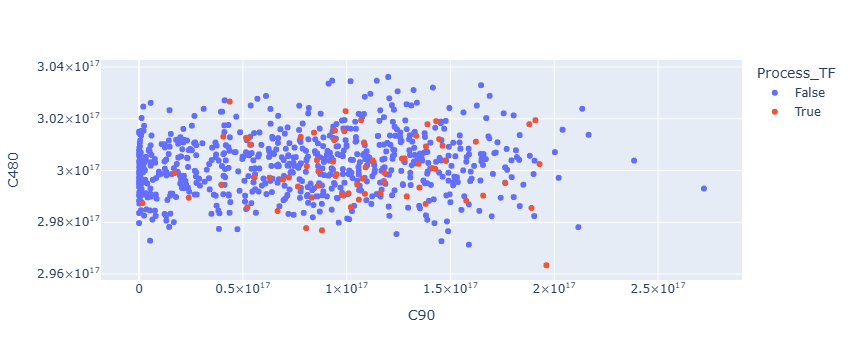

In [38]:
px.scatter(merge_df, x = 'C90', y = 'C480', color='Process_TF')

# 16. 시계열 분석(time series)

- 시계열 분석은 시간에 따른 연속형 변수의 예측 및 trend 파악
  - 특정 간격을 갖는 시간의 주기 lag
  - lag에서 데이터의 특성을 찾는 것
- 시계열 분석의 종류
  - 전통 통계 분석에서 시계열 분석
    - 개별 시계열 데이터의 특성을 이용하여 예측
    - 특정 시점이나 좁은 구간의 데이터를 바탕으로 모델을 구성, 예측
    - 정상성 검정(해당 연속형 자료가 통계쩍인 분석을 수행하기에 적합한 데이터인지 검정)
    - 전통 회귀 모형을 기반으로 한 예측 모형(naive, ets, arima, sarimax, thera, ...)
  - 마이닝 기반의 시계열 분석
    - 다수의 시계열 데이터를 통합하여 공통의 패턴을 학습하고 예측
    - 장기적인 패턴이나 예측을 수행
    - 머신러닝 기반의 모델, 딥러닝 기반의 모델(ensemble, prophet, rnn, transformer, ...)

- **정상성 (stationary)**
- 전통적 통계기법을 이용하기 위해, 시계열 모형을 사용함에 있어 예측하려는 자료가 모집단의 추정이 가능한 자료인지를 판단하는 기준
- 비정상성 자료(이상치나 패턴이 일정하지 않은)들을 정상성을 만족하도록 변환한 뒤 분석을 수행해야 정확한 예측이 가능
- 정상성을 판단하는 요소
  - 일정한 평균(데이터의 평균이 시간에 의존하지 않음), 정상성을 갖는 데이터는 평균으로 회귀하려는 경향이 있어 예측이 용이
  - 일정한 분산(분산이 시간에 의존하지 않음), 과거의 변동성을 잘 반영하여 시계열 예측에 용이
  - 일정한 공분산(데이터의 시계열 진폭이 시간에 의존하지 않음)
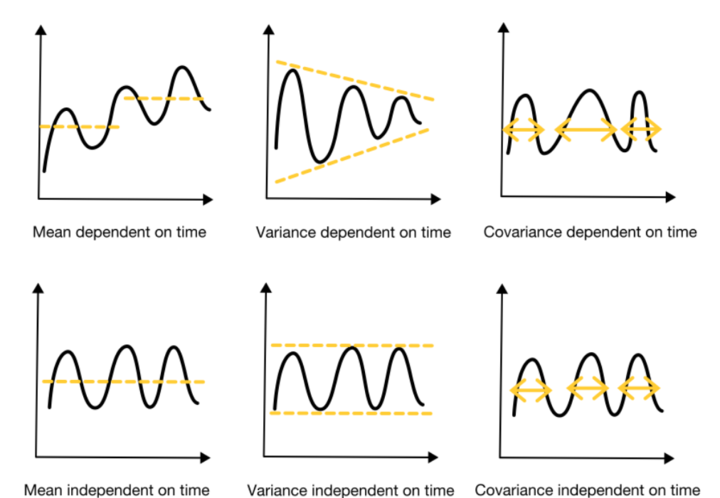